<a href="https://colab.research.google.com/github/Marlyn77/RedNeuronal/blob/main/Hola.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pathlib
from PIL import Image
import os
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Cafe.zip to Cafe (1).zip


In [ ]:
!pwd

/content


In [4]:
import zipfile
import io

data = zipfile.ZipFile(io.BytesIO(uploaded['Cafe (1).zip']),'r')
data.extractall()

NameError: ignored

In [ ]:
import cv2

In [ ]:
dir_cafe_sano = "/content/Cafe/Sano"
dir_cafe_minador = "/content/Cafe/Minador"
dir_cafe_roya = "/content/Cafe/Roya"
dir_cafe_phoma = "/content/Cafe/Phoma"
dir_cafe_cercospora = "/content/Cafe/Cercospora"

Sano = []
Minador = []
Roya = []
Phoma = []
Cercospora = []

data_cafe_sano = pathlib.Path(dir_cafe_sano)
data_cafe_minador = pathlib.Path(dir_cafe_minador)
data_cafe_roya = pathlib.Path(dir_cafe_roya)
data_cafe_phoma = pathlib.Path(dir_cafe_phoma)
data_cafe_cercospora = pathlib.Path(dir_cafe_cercospora)


Previsualizacion de las imagenes

Hojas sanas

In [ ]:
for img in os.listdir(data_cafe_sano):
    img = cv2.imread(os.path.join(dir_cafe_sano, img))
    Sano.append([img])
print(len(Sano))
print(Sano)

for img in os.listdir(data_cafe_minador):
    img = cv2.imread(os.path.join(dir_cafe_minador, img))
    Minador.append([img])
print(len(Minador))
print(Minador)

for img in os.listdir(data_cafe_roya):
    img = cv2.imread(os.path.join(dir_cafe_roya, img))
    Roya.append([img])
print(len(Roya))
print(Roya)

for img in os.listdir(data_cafe_phoma):
    img = cv2.imread(os.path.join(dir_cafe_phoma, img))
    Phoma.append([img])
print(len(Phoma))
print(Phoma)

for img in os.listdir(data_cafe_cercospora):
    img = cv2.imread(os.path.join(dir_cafe_cercospora, img))
    Cercospora.append([img])
print(len(Cercospora))
print(Cercospora)

Se han truncado las últimas 5000 líneas del flujo de salida.
        [191, 193, 204],
        [191, 193, 204],
        ...,
        [146, 158, 170],
        [146, 158, 170],
        [146, 158, 170]]], dtype=uint8)], [array([[[173, 177, 188],
        [173, 177, 188],
        [173, 177, 188],
        ...,
        [170, 182, 194],
        [170, 182, 194],
        [170, 182, 194]],

       [[173, 177, 188],
        [173, 177, 188],
        [173, 177, 188],
        ...,
        [170, 182, 194],
        [170, 182, 194],
        [170, 182, 194]],

       [[173, 177, 188],
        [173, 177, 188],
        [173, 177, 188],
        ...,
        [170, 182, 194],
        [170, 182, 194],
        [170, 182, 194]],

       ...,

       [[163, 165, 175],
        [163, 165, 175],
        [163, 165, 175],
        ...,
        [159, 171, 183],
        [159, 171, 183],
        [159, 171, 183]],

       [[163, 165, 175],
        [163, 165, 175],
        [163, 165, 175],
        ...,
        [159, 171, 183

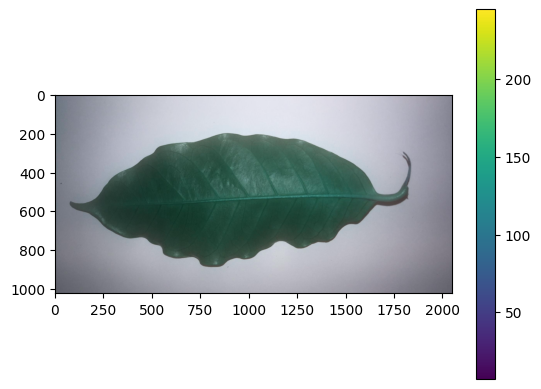

In [ ]:
plt.figure()
plt.imshow(np.squeeze(Sano[0]))
plt.colorbar()
plt.show()

In [ ]:
Sano = np.array(Sano)
print(Sano.shape)

(145, 1)


In [ ]:
Minador = np.array(Minador)
print(Minador.shape)

(202, 1, 1024, 2048, 3)


In [ ]:
Roya = np.array(Roya)
print(Roya.shape)

(297, 1, 1024, 2048, 3)


In [ ]:
Phoma = np.array(Phoma)
print(Phoma.shape)

(320, 1, 1024, 2048, 3)


In [ ]:
Cercospora = np.array(Cercospora)
print(Cercospora.shape)

(99, 1, 1024, 2048, 3)


In [ ]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.callbacks import TensorBoard
from IPython.display import HTML

In [ ]:

BATCH_SIZE = 32
IMAGE_SIZE = 56
CHANNELS=3


In [ ]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/Cafe",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 1062 files belonging to 5 classes.


In [ ]:
class_names = dataset.class_names
class_names

NameError: ignored

In [ ]:

for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

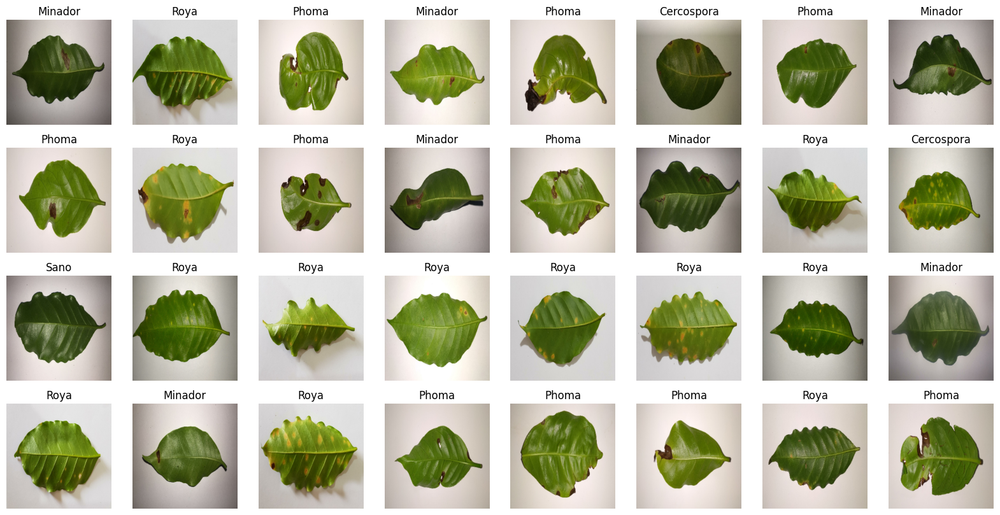

In [ ]:
plt.figure(figsize=(20, 10))
for image_batch, labels_batch in dataset.take(1):
    for i in range(32):
        ax = plt.subplot(4, 8, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

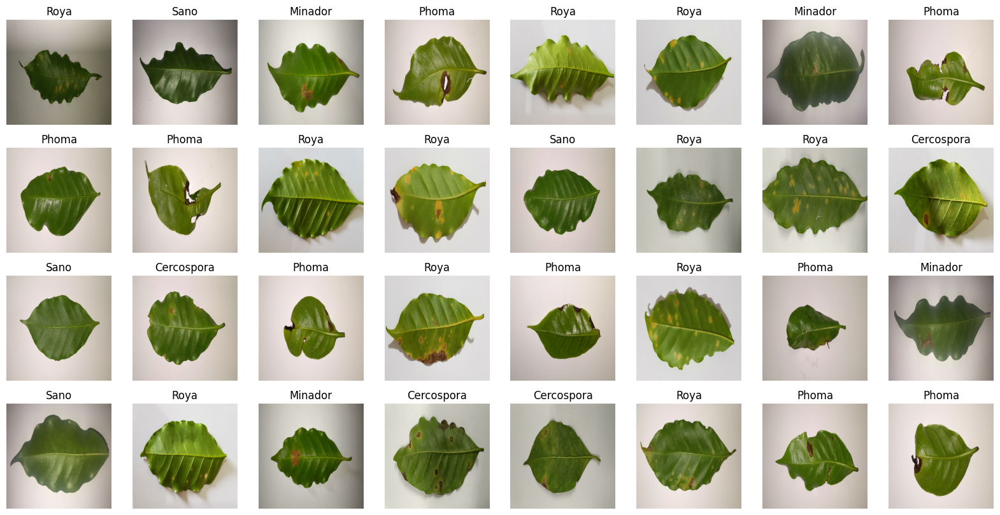

In [ ]:
plt.figure(figsize=(20, 10))
for image_batch, labels_batch in dataset.take(3):
    for i in range(32):
        ax = plt.subplot(4, 8, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

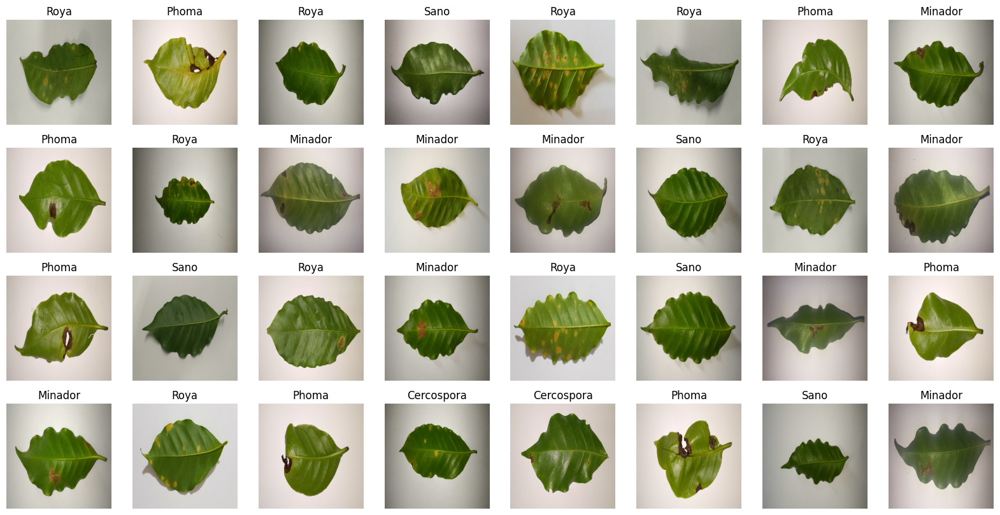

In [ ]:
plt.figure(figsize=(20, 10))
for image_batch, labels_batch in dataset.take(2):
    for i in range(32):
        ax = plt.subplot(4, 8, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

In [ ]:
len(dataset)

34

In [ ]:
def set_train_val_test(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1

    ds_size = len(ds)

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)

    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)

    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds, val_ds, test_ds

In [ ]:
train_ds, val_ds, test_ds = set_train_val_test(dataset)

In [ ]:
print("Training:",len(train_ds),"- Testing:",len(test_ds),"- Validation:",len(val_ds))

Training: 27 - Testing: 4 - Validation: 3


Aumento de datos

In [ ]:

data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

In [ ]:
train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:

len(train_ds)

27

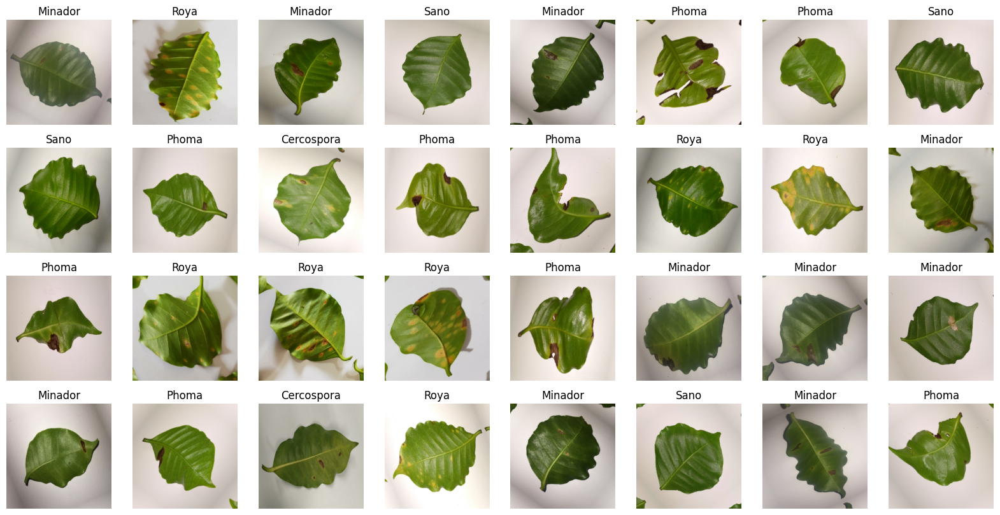

In [ ]:

plt.figure(figsize=(20, 10))
for image_batch, labels_batch in train_ds.take(3):
    for i in range(32):
        ax = plt.subplot(4, 8, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

In [ ]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  layers.experimental.preprocessing.Rescaling(1./255),
])


In [ ]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 5
EPOCHS = 10

model_1 = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(16, 3, padding='same', activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(100, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model_2 = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, 3, padding='same', activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(100, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])
model_3 = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, 3, padding='same', activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(100, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model_4 = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(16, 3, padding='same', activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(100, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])
model_5 = models.Sequential([
    #resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])
model_6 = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, 3, padding='same', activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    #layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    #layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    #layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.5),
    layers.Flatten(),
    layers.Dense(100, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(50, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

In [ ]:

# model_1.build(input_shape=input_shape)

# model_1.build(input_shape=input_shape)

In [ ]:
model_1.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

model_2.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

model_3.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

model_4.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

model_5.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)
model_6.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)


In [ ]:
tensorboardModel1 = TensorBoard(log_dir='logs/model_1')

history1 = model_2.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=EPOCHS,
    callbacks=[tensorboardModel1],
)

Epoch 1/10


InvalidArgumentError: ignored

In [ ]:
#Cargar la extension de tensorboard de colab
%load_ext tensorboard

In [ ]:

#Ejecutar tensorboard e indicarle que lea la carpeta "logs"
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
scores_1 = model_1.evaluate(test_ds)

8/8 [==============================] - 12s 931ms/step - loss: 0.2222 - accuracy: 0.9453


In [ ]:

scores_1

[0.22216901183128357, 0.9453125]

In [ ]:
!ls "/content/Potato"

Potato___Early_blight  Potato___healthy  Potato___Late_blight


first image to predict
actual label: Potato___healthy
1/1 [==============================] - 1s 1s/step
predicted label: Potato___healthy


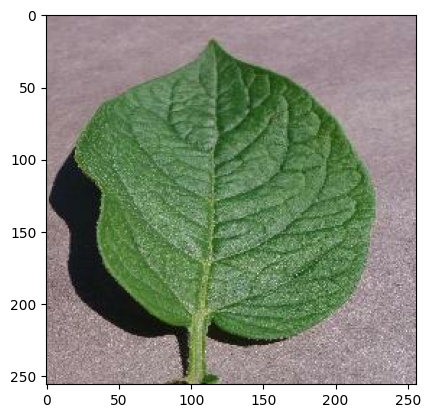

In [ ]:
for images_batch, labels_batch in test_ds.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])

    batch_prediction = model_1.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])